<html>
<header style="text-align: center;">
<h1>The Implementation of Shape-from-Shadow<sup id="cite-ref-1">[1]</sup>.</h1>
<p>Reconstructing shapes from shadow map with some modifications compared to the original paper.</p>
</header>
</html>

> 1. <a href="#cite-ref-2" id="cite-2"> Liu, Ruoshi, et al. "Shadows shed light on 3D objects." arXiv preprint arXiv:2206.08990 (2022).</a> 
---

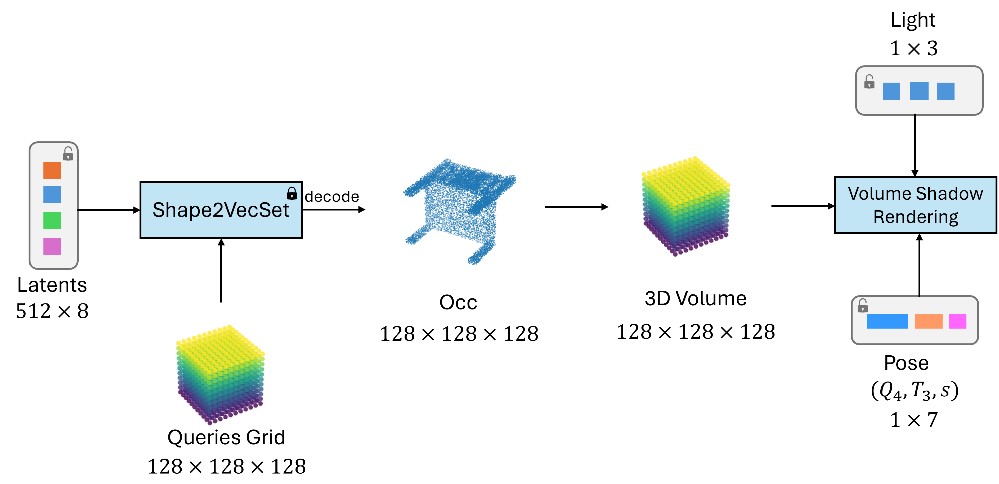

## Modules

### 3D VAE

The orginal generator is too outdated. We implemented Shape2VecSet <sup id="cite-ref-2">[2]</sup> as 3D VAE(Generator in the raw paper.), which takes a latent vector set with the shape of $M \times l$ as inputs and the outputs occupancy grid directly.

> 2. <a href="#cite-ref-2" id="cite-2">Zhang, Biao, et al. "3dshape2vecset: A 3d shape representation for neural fields and generative diffusion models." ACM Transactions on Graphics (TOG) 42.4 (2023): 1-16.</a>

#### 3D Volume Query

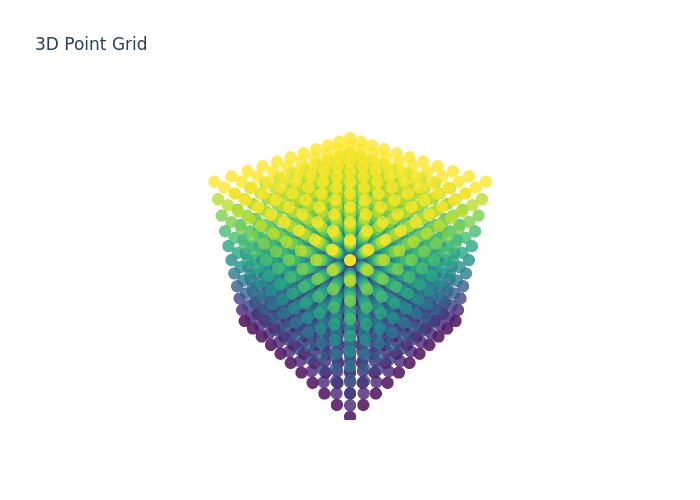

In [6]:
import plotly.graph_objects as go
import numpy as np


x, y, z = np.meshgrid(np.arange(-5, 6, 1),
                      np.arange(-5, 6, 1),
                      np.arange(-5, 6, 1))


x = x.flatten()
y = y.flatten()
z = z.flatten()


fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=4,
        color=z,                
        colorscale='Viridis',   
        opacity=0.8
    )
)])


fig.update_layout(scene=dict(
                    xaxis=dict(visible=False),
                    yaxis=dict(visible=False),
                    zaxis=dict(visible=False)),
                  title="3D Point Grid")

fig.write_image("volume_query.png")
from IPython.display import Image, display
display(Image("volume_query.png"))


##### VAE Shape Reconstruction

Shape-to-vec-to-Occ

2024-12-29 16:21:37,373-rank0-s2vs_ae.py#48:Model: kl_d512_m512_l8
2024-12-29 16:21:37,376-rank0-s2vs_ae.py#49:Pretrain: /home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth


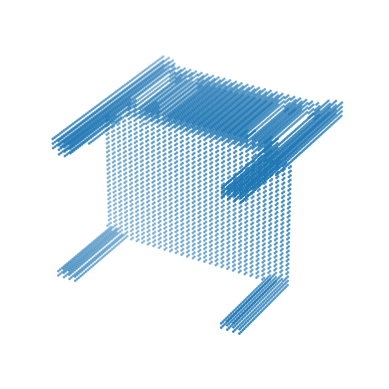

In [1]:
from sfs.model.autoencoders import get_autoencoder, Shape2VecSetAutoEncoderCfg

import mcubes
import trimesh
import torch
import numpy as np 
from pathlib import Path
from einops import rearrange
import matplotlib.pyplot as plt

gap = 2. / 128
cfg = Shape2VecSetAutoEncoderCfg(name = 'shape2vecset', pretrained_weight='/home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth')
shape2vecset_autoencoder = get_autoencoder(cfg).cuda()

# Load sample mesh 
sample_path = Path('/mntdata/shapenet/sample')
hash_id = 'a6d282a360621055614d73f24792753f'
sample_surface_path = sample_path / 'surface' / f'{hash_id}.npz'
surface = np.load(sample_surface_path)["points"]

ind = np.random.default_rng().choice(
                    surface.shape[0], 2048, replace=False)
surface2048 = torch.from_numpy(surface[ind][None]).cuda().float()
output = shape2vecset_autoencoder.auto_encoder(surface2048, shape2vecset_autoencoder.grid_queries)['logits']


data = shape2vecset_autoencoder.grid_queries[output>0].cpu()
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(data[:, 0], data[:, 1], data[:, 2], s=1)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_axis_off()  
plt.savefig('vae.png')


##### Latent-to-Shape (Generator)

In [2]:
%reload_ext autoreload

import sys
sys.path.append('/home/yangli/sfs')

from sfs.model.autoencoders import get_autoencoder, Shape2VecSetAutoEncoderCfg
from sfs.model.types import OptimizationVariables

import mcubes
import trimesh
import torch

gap = 2. / 128
cfg = Shape2VecSetAutoEncoderCfg(name = 'shape2vecset', pretrained_weight='/home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth')
shape2vecset_autoencoder = get_autoencoder(cfg).cuda()

context:OptimizationVariables = {"latent_set": torch.randn(1,512,8).cuda(),
                                 "light_position": torch.randn(1,3).cuda(),
                                 "object_pose": torch.randn(1,6).cuda(),
                                 "object_scale": torch.tensor([1.0]).cuda}

occ_vol = shape2vecset_autoencoder(context)
verts, faces = mcubes.marching_cubes(occ_vol.occ_logits.detach().cpu().numpy()[0], 0)
verts *= gap
verts -= 1.
m = trimesh.Trimesh(verts, faces)
m.export('test.obj')

import plotly.graph_objects as go
fig = go.Figure(data=[go.Mesh3d(
    x=verts[:, 0],
    y=verts[:, 1],
    z=verts[:, 2],
    i=faces[:, 0],
    j=faces[:, 1],
    k=faces[:, 2],
    opacity=0.5,
    color='cyan'
)])

fig.update_layout(scene=dict(aspectmode='data'))

fig.show()


2024-12-29 16:21:59,543-rank0-s2vs_ae.py#48:Model: kl_d512_m512_l8
2024-12-29 16:21:59,544-rank0-s2vs_ae.py#49:Pretrain: /home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth


### Shadow Renderer

We have made some modifications for boosting the shadow map rendering process, in order to balance the incremental computational cost of the larger latent vector set.

#### Efficient Space-skipping Ray Marching

Since our inputs include occupancy grid, space-skipping in Instant-NGP <sup id="cite-ref-3">[3]</sup> has been applied to boost ray marching.
> 3. <a href="#cite-ref-3" id="cite-3"> Müller, Thomas, et al. "Instant neural graphics primitives with a multiresolution hash encoding." ACM transactions on graphics (TOG) 41.4 (2022): 1-15.

2024-12-29 16:22:20,527-rank0-s2vs_ae.py#48:Model: kl_d512_m512_l8
2024-12-29 16:22:20,529-rank0-s2vs_ae.py#49:Pretrain: /home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth
tensor([0.0100, 0.0100, 0.0100,  ..., 0.0100, 0.0100, 0.0100], device='cuda:0') tensor([2.4495, 2.4367, 2.4243,  ..., 2.4243, 2.4367, 2.4495], device='cuda:0')
torch.return_types.min(
values=tensor([-0.2500, -0.4993, -0.2500], device='cuda:0'),
indices=tensor([77905, 40409, 85209], device='cuda:0'))
torch.return_types.max(
values=tensor([0.2500, 0.4062, 0.2500], device='cuda:0'),
indices=tensor([ 82005, 405415, 116600], device='cuda:0'))
torch.Size([409600, 3])


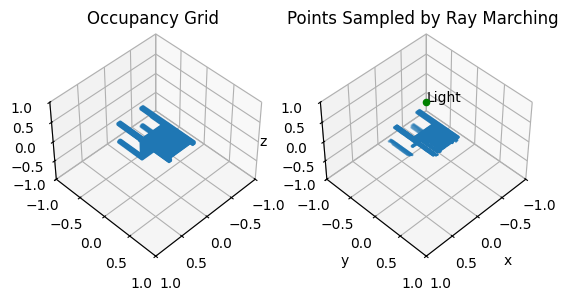

In [3]:
# Copyright (c) 2024 Yang Li, Microsoft. All rights reserved.
# MIT License.
# 
# --------------------------------------------------------
# Unit Test:
#       - CUDA-based Efficient Ray Marching
# --------------------------------------------------------
# Reference:
#       - https://github.com/NVlabs/instant-ngp
# --------------------------------------------------------
# Created on Wed Dec 25 2024.

from sfs.model.render_pipelines.vol_render import raymarching
from sfs.model.render_pipelines.vol_render.nerf.renderer import near_far_from_aabb, custom_meshgrid
from sfs.model.autoencoders import get_autoencoder, Shape2VecSetAutoEncoderCfg
from sfs.model.types import OptimizationVariables

import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path
from einops import rearrange, repeat

RES = 128 # Grid Resolution
CAS = 1 # Number of Multi-resolution Occ Grid
SIGMA_THR = 0.5 # Determine whether skip the queried cell
RENDER_RES =64 

gap = 2. / 128
device = 'cuda:0'

# ! There may be some bugs in CUDA implementation of Morton 3D Encoding, pytorch instead
def morton3D(coords):
    def part1by2(n):
        n &= 0x1fffff  # we only look at the first 21 bits
        n = (n | n << 32) & 0x1f00000000ffff
        n = (n | n << 16) & 0x1f0000ff0000ff
        n = (n | n << 8) & 0x100f00f00f00f00f
        n = (n | n << 4) & 0x10c30c30c30c30c3
        n = (n | n << 2) & 0x1249249249249249
        return n

    def _morton3D(x, y, z):
        return (part1by2(x) | part1by2(y) << 1 | part1by2(z) << 2)

    morton_codes = []
    for coord in coords:
        x, y, z = coord
        morton_code = _morton3D(x.item(), y.item(), z.item())
        morton_codes.append(morton_code)
    return torch.tensor(morton_codes, dtype=torch.int32).type_as(coords)

cfg = Shape2VecSetAutoEncoderCfg(name = 'shape2vecset', pretrained_weight='/home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth', occ_resolution=RES)
shape2vecset_autoencoder = get_autoencoder(cfg).cuda()

# Load sample mesh 
sample_path = Path('/mntdata/shapenet/sample')
hash_id = 'a6d282a360621055614d73f24792753f'
sample_surface_path = sample_path / 'surface' / f'{hash_id}.npz'
surface = np.load(sample_surface_path)["points"]

ind = np.random.default_rng().choice(
                    surface.shape[0], 2048, replace=False)
surface2048 = torch.from_numpy(surface[ind][None]).cuda().float()
latent = shape2vecset_autoencoder.auto_encoder(surface2048, shape2vecset_autoencoder.grid_queries)['latent_set']
output = shape2vecset_autoencoder({'latent_set':latent})
occ = (output.occ_logits > 0).float()

# plot
fig, ax = plt.subplots(1,2,subplot_kw={'projection': '3d'})
data = output.grid[output.occ_logits>0].cpu()
ax[0].scatter(data[:, 0], data[:, 1], data[:, 2], s=1)
ax[0].set_xlim([-1, 1])
ax[0].set_ylim([-1, 1])
ax[0].set_zlim([-1, 1])
ax[0].set_title('Occupancy Grid')


# ! raymarching.density_grid is morton-ordered
# construct density grid
xx, yy, zz = custom_meshgrid(torch.arange(RES, dtype=torch.int32), 
                             torch.arange(RES, dtype=torch.int32), 
                             torch.arange(RES, dtype=torch.int32)) # ! int32 MUST be specified since Morton3D involves bitwise operations

coords = rearrange([xx, yy, zz], "xyz X Y Z -> () X Y Z xyz") 
indices = morton3D(rearrange(coords, "() X Y Z xyz -> (X Y Z) xyz")).long() # [N]
occ = rearrange(occ, "() Z Y X -> () () Z Y X ")
density_grid = torch.zeros(CAS, RES * RES * RES).type_as(occ)
density_grid[0, indices] = rearrange(occ, "() () Z Y X -> (Y X Z)")
density_bitfield = raymarching.packbits(density_grid, SIGMA_THR) # [CAS, H ** 3] -> [CAS, H ** 3 // 8]


# Efficient Ray Marching
# Init Render Context
light_pos = torch.tensor([0,0,1.]).to(device)

# Generate Rays
ground_xy = torch.meshgrid(torch.linspace(-1,1, RENDER_RES), torch.linspace(-1,1,RENDER_RES), indexing = 'xy')
ground_xyz = rearrange([*ground_xy, -torch.ones(RENDER_RES, RENDER_RES)], "xyz h w -> (h w) xyz").to(device)
rays_o = repeat(light_pos, "xyz -> b xyz", b=RENDER_RES**2).contiguous()
rays_d = ground_xyz - light_pos
rays_d = rays_d / rays_d.norm(dim=-1, keepdim=True).contiguous()
nears, fars = raymarching.near_far_from_aabb(rays_o, rays_d, torch.tensor([-1.,-1.,-1.,1.,1.,1.]).to(device), 0.01)
print(nears, fars)
n_alive = RENDER_RES ** 2
n_step = 100
rays_alive = torch.arange(n_alive, dtype=torch.int32).to(device)
rays_t = nears.clone()

# CUDA Implementation of sampling along rays
xyzs, dirs, ts = raymarching.march_rays(
                                        n_alive,
                                        n_step,
                                        torch.arange(n_alive, device = device).int(),
                                        rays_t,
                                        rays_o, 
                                        rays_d, 
                                        2., 
                                        True, 
                                        density_bitfield, 
                                        1, 
                                        RES, 
                                        nears, 
                                        fars, 
                                        )


data = xyzs.cpu()
print(xyzs.min(dim=0))
print(xyzs.max(dim=0))
print(xyzs.shape)
ground_xyz = ground_xyz.cpu()
# ax[1].scatter(ground_xyz[:,0], ground_xyz[:,1],ground_xyz[:,2], color = 'red')
ax[1].scatter(data[::50, 0], data[::50, 1], data[::50, 2], s=1)
light_pos= light_pos.cpu()
ax[1].scatter(light_pos[0], light_pos[1],light_pos[2], color = 'green')
ax[1].text(light_pos[0], light_pos[1],light_pos[2], 'Light')
ax[1].set_xlim([-1, 1])
ax[1].set_ylim([-1, 1])
ax[1].set_zlim([-1, 1])
ax[1].set_title('Points Sampled by Ray Marching')
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].set_zlabel('z')

view_func = lambda x: x.view_init(elev=45, azim=45) # View Control Handle
list(map(view_func, ax))
plt.show()


##### Comparison with the original sampling

Our sampling module queries much less points per ray.

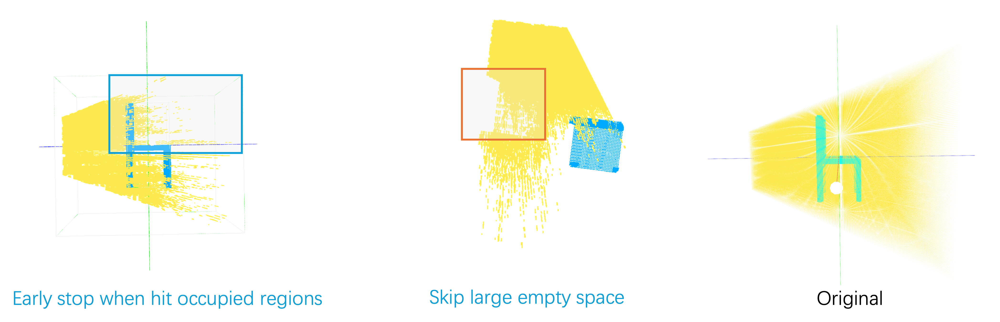

#### Shadow Rendering

For the shadow rendering, we implement the orginal version, i.e., `intensity = max(occ_along_ray)`. We adopt 3D volume to accelerate the rendering with **higher memory occupancy**.

2024-12-29 16:24:42,865-rank0-s2vs_ae.py#48:Model: kl_d512_m512_l8
2024-12-29 16:24:42,867-rank0-s2vs_ae.py#49:Pretrain: /home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth
2024-12-29 16:24:44,849-rank0-2238349820.py#101:Peak CUDA Memoy Allocated: 25.70 GB


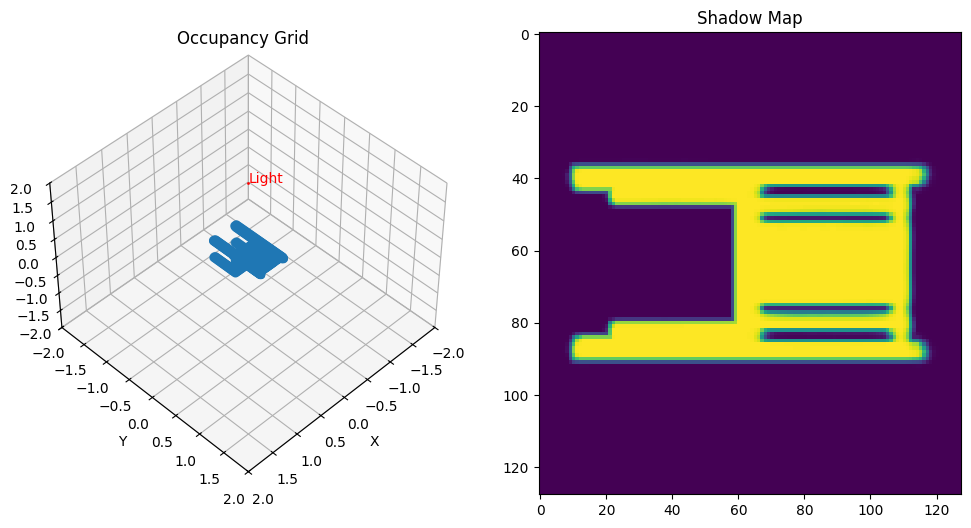

In [1]:
# Copyright (c) 2024 Yang Li, Microsoft. All rights reserved.
# MIT License.
# 
# --------------------------------------------------------
# Unit Test:
#       - Render ground shadow map from 3D mesh and single light
# --------------------------------------------------------
# 
# Created on Tue Dec 24 2024.

# Pre-type-checking
from jaxtyping import install_import_hook

with install_import_hook(
    ("src",),
    ("beartype", "beartype"),
):
    from sfs.model.autoencoders import get_autoencoder, Shape2VecSetAutoEncoderCfg
    from sfs.model.render_pipelines import get_renderer, ShadowRenderCfg
    from sfs.model.types import OptimizationVariables

from sfs.utils.sys_monitor import PeakCUDAMemoryTracker
from sfs.utils.logger import std_logger
from sfs.utils.export import export_img

import numpy as np
import torch
import matplotlib.pyplot as plt
from pathlib import Path



RES = 128 # Grid Resolution
CAS = 1 # Number of Cascades of Multi-resolution Occ Grid
SIGMA_THR = 1e-2 # Determine whether skip the queried cell
RENDER_RES =128
ITVL = 100
BOUND = 2.

device = torch.device("cuda:0")

cfg = Shape2VecSetAutoEncoderCfg(name = 'shape2vecset', pretrained_weight='/home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth', occ_resolution=RES)
shape2vecset_autoencoder = get_autoencoder(cfg).cuda()

cfg = ShadowRenderCfg(name = 'simple_shadow_render', ground_res=RENDER_RES, ground_aabb= (-1.,-1.,1.,1.), sample_per_ray= 128)
shadow_renderer = get_renderer(cfg).cuda()

# Load sample mesh 
sample_path = Path('/mntdata/shapenet/sample')
hash_id = 'a6d282a360621055614d73f24792753f'
sample_surface_path = sample_path / 'surface' / f'{hash_id}.npz'
surface = np.load(sample_surface_path)["points"]

# Plot
fig = plt.figure(figsize=(12, 6))

ax_occ = fig.add_subplot(121, projection='3d')
ax_occ.set_title('Occupancy Grid')
ax_occ.set_xlabel("X")
ax_occ.set_ylabel("Y")
ax_occ.set_zlabel("Z")
ax_occ.set_xlim(-BOUND, BOUND)
ax_occ.set_ylim(-BOUND, BOUND)
ax_occ.set_zlim(-BOUND, BOUND)

ax_shadow = fig.add_subplot(122)
ax_shadow.set_title('Shadow Map')

ind = np.random.default_rng().choice(
                    surface.shape[0], 2048, replace=False)
surface2048 = torch.from_numpy(surface[ind][None]).cuda().float()
latent = shape2vecset_autoencoder.auto_encoder(surface2048, shape2vecset_autoencoder.grid_queries)['latent_set']
occ_vol = shape2vecset_autoencoder({'latent_set':latent})

pts3d = occ_vol.grid[ occ_vol.occ_logits > 0].view(-1,3).cpu()
ax_occ.scatter(pts3d[:, 0], pts3d[:, 1], pts3d[:, 2]) 

# light_position = torch.randn(1,3)
# light_position[:, 2] = (light_position[:, 2] + 2 ) / 2

light_position = torch.tensor([[0.,0.,2.]])

ax_occ.scatter(*light_position[0], color='r', s=1) 
ax_occ.text(*light_position[0], 'Light', color='red') 


scene = OptimizationVariables(latent_set=torch.randn(1, 512).cuda(),
                              light_position=light_position.cuda(),
                              object_pose=torch.tensor([[0.,0.,0.,1.,0.,0.,0.]]).cuda(),
                              object_scale=torch.tensor([1.0]).cuda())

with PeakCUDAMemoryTracker() as tracker:
    shadow_pred = shadow_renderer(scene, occ_vol)

ax_shadow.imshow(shadow_pred["shadow_map"][0].detach().cpu(), cmap='viridis', aspect='auto')
view_func = lambda x: x.view_init(elev=45, azim=45)
list(map(view_func, [ax_occ]))
fig.savefig("shadow.png")
fig.show()

std_logger.warning(f"Peak CUDA Memoy Allocated: {tracker.peak_memory / 1024**3:.2f} GB")

### Optimization

#### Learnable paramters
- light position (1x3), 
- object pose: Instead of $SE(3)$ matrix, we implemented quaternion for better interpolation.
    - rotation quaternion & translation (1x7)m
    - scale (1x1),
- object latents set (512 x 8). 

#### Platform
- NVIDIA A100 80G

#### Train from Scratch

In [1]:
%%bash
conda activate sfs
CUDA_VISIBLE_DEVICES=0 python main.py +output_dir=demo dataset.data_path=assets/sample_shadow.png


CondaError: Run 'conda init' before 'conda activate'



2024-12-29 16:36:35,227-rank0-main.py#85:Saving outputs to outputs/demo.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


2024-12-29 16:36:35,815-rank0-s2vs_ae.py#48:Model: kl_d512_m512_l8
2024-12-29 16:36:35,815-rank0-s2vs_ae.py#49:Pretrain: /home/yangli/sfs/checkpoints/pretrained/ae_kl_d512_m512_l8.pth


wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: aurora_ly. Use `wandb login --relogin` to force relogin
wandb: Tracking run with wandb version 0.19.1
wandb: Run data is saved locally in outputs/demo/wandb/run-20241229_163638-qw9l8lci
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run demo (outputs/demo)
wandb: ⭐️ View project at https://wandb.ai/aurora_ly/shape_from_shadow
wandb: 🚀 View run at https://wandb.ai/aurora_ly/shape_from_shadow/runs/qw9l8lci
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name            | Type                    | Params | Mode 
--------------------------------------------------------------------
0 | shape_ae        | Shape2VecSetAutoEncoder | 106 M  | train
1 | render_pipeline | ShadowRender            | 0      | train
2 | scene_context   | ParameterDict           | 4.1 K  | train
--------------------------------------------------------------------
1

2024-12-29 16:36:39,202-rank0-pl_wrapper.py#147:validation step 0; 
2024-12-29 16:36:40,715-rank0-main.py#65:Code backup into outputs/demo/code
2024-12-29 16:36:41,014-rank0-pl_wrapper.py#131: train step 0; loss = 0.523870
2024-12-29 16:36:41,675-rank0-pl_wrapper.py#131: train step 1; loss = 0.499011
2024-12-29 16:36:42,221-rank0-pl_wrapper.py#131: train step 2; loss = 0.489038
2024-12-29 16:36:42,763-rank0-pl_wrapper.py#131: train step 3; loss = 0.514039
2024-12-29 16:36:43,306-rank0-pl_wrapper.py#131: train step 4; loss = 0.502452
2024-12-29 16:36:43,852-rank0-pl_wrapper.py#131: train step 5; loss = 0.520455
2024-12-29 16:36:44,399-rank0-pl_wrapper.py#131: train step 6; loss = 0.506178
2024-12-29 16:36:44,942-rank0-pl_wrapper.py#131: train step 7; loss = 0.504976
2024-12-29 16:36:45,482-rank0-pl_wrapper.py#131: train step 8; loss = 0.497776
2024-12-29 16:36:46,027-rank0-pl_wrapper.py#131: train step 9; loss = 0.510183
2024-12-29 16:36:46,569-rank0-pl_wrapper.py#131: train step 10; lo

2024-12-29 16:46:03,286-rank0-pl_wrapper.py#131: train step 1032; loss = 0.067701
2024-12-29 16:46:03,828-rank0-pl_wrapper.py#131: train step 1033; loss = 0.065383
2024-12-29 16:46:04,372-rank0-pl_wrapper.py#131: train step 1034; loss = 0.082918
2024-12-29 16:46:04,916-rank0-pl_wrapper.py#131: train step 1035; loss = 0.063212
2024-12-29 16:46:05,463-rank0-pl_wrapper.py#131: train step 1036; loss = 0.067621
2024-12-29 16:46:06,009-rank0-pl_wrapper.py#131: train step 1037; loss = 0.069481
2024-12-29 16:46:06,556-rank0-pl_wrapper.py#131: train step 1038; loss = 0.065561
2024-12-29 16:46:07,099-rank0-pl_wrapper.py#131: train step 1039; loss = 0.066066
2024-12-29 16:46:07,613-rank0-pl_wrapper.py#131: train step 1040; loss = 0.067786
2024-12-29 16:46:08,157-rank0-pl_wrapper.py#131: train step 1041; loss = 0.068495
2024-12-29 16:46:08,457-rank0-pl_wrapper.py#131: train step 1042; loss = 0.064836
2024-12-29 16:46:09,001-rank0-pl_wrapper.py#131: train step 1043; loss = 0.076211
2024-12-29 16:46


Detected KeyboardInterrupt, attempting graceful shutdown ...


wandb: 🚀 View run demo (outputs/demo) at: https://wandb.ai/aurora_ly/shape_from_shadow/runs/qw9l8lci


#### Conclusion
While we expected more powerful 3D VAE (Shape2VecSet) would have better results, the experiment shows that it is hard for 3D VAE trained on all catergories (other than chairs) with much larger latent space ($512 \times 8$) to learn the exact shape from sole shadow map.

### Todo

- \[x\] CUDA Implementation of Efficient Ray Marching based on Occ Grid,
- \[ \] CUDA Implementation of Occupancy Grid Samping (now `torch.nn.functional.grid_sample()`),
- \[ \] Warp Shadow Map to arbitrary views (now top-view).